In [1]:
import os
import sys

import pickle

import pandas as pd
import numpy as np
import datetime
from dateutil.relativedelta import relativedelta
import sklearn.preprocessing as skp
import sklearn.metrics as skm
import sklearn.decomposition as skd
import sklearn.feature_selection as skf
import sklearn.svm as sksvm
import sklearn.ensemble as ske
import sklearn.tree as skt

import scipy.stats as scs
import statsmodels.stats as sms
import statsmodels.tsa.api as smt
import statsmodels.api as sm

import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
py.init_notebook_mode(connected=True)

/opt/anaconda3/envs/crypto-env/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
from sklearn.linear_model import LogisticRegression

In [3]:
from TCC_pkg import dataanalysis as da
from TCC_pkg import testspecification as tspec
from TCC_pkg import technicalanalysis as ta
from TCC_pkg import autoregressive as ar

# <span style='color:crimson'>1.</span> Input Data

In [4]:
#======== [USER-DEFINED] ========#
series_name = 'bitcoin'
start_dates = ['2017-01','2017-05','2017-09','2018-01']
#================================#

## <span style='color:MediumBlue'>1.1.</span> Stock series

In [5]:
with open('../Data/{}.pkl'.format(series_name), 'rb') as f:
    df_raw = pickle.load(f)
    
df_raw

,Close,High,Low,Open,Volume,Volume_USD,Weighted_Price,Direction
Date,,,,,,,,
2013-01-01,13.2200,13.2400,12.7700,13.2400,2116.929409,2.753643e+04,13.007723,NaN
2013-01-02,13.0900,13.1900,12.9800,13.1200,1840.848724,2.411405e+04,13.099419,-1.0
2013-01-03,13.1900,13.2600,12.9600,13.0900,3320.972054,4.360927e+04,13.131477,1.0
2013-01-04,13.1900,13.2400,12.8400,13.1200,2700.253507,3.536447e+04,13.096723,-1.0
2013-01-05,13.1500,13.1900,13.0300,13.1900,1463.535849,1.922127e+04,13.133449,-1.0
2013-01-06,13.1500,13.1500,13.0600,13.1100,453.563089,5.943520e+03,13.104064,-1.0
2013-01-07,13.2000,13.2000,13.0400,13.1000,3935.248457,5.174181e+04,13.148295,1.0
2013-01-08,13.5000,13.5000,13.0500,13.2000,6086.275155,8.116631e+04,13.335958,1.0
2013-01-09,13.5800,13.6500,13.1800,13.5100,4640.267393,6.225810e+04,13.416921,1.0


In [6]:
da.candleplot(df_raw.drop(columns=['Direction', 'Volume']))

## <span style='color:MediumBlue'>1.2.</span> Network Data

### <span style='color:Goldenrod'>1.2.1.</span> Total Transaction Fees (USD)

In [7]:
file_path = '../Data/transaction-fees.csv'
df = pd.read_csv(file_path)
df = df.rename(columns={'2009-01-03 00:00:00':'Date', '0.0':'Fee_BTC'})
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df.iloc[0] = df.iloc[1]
df.iloc[2::2] = df.iloc[1::2].values
df_fee = df.copy()
da.plotscatter(df_fee)

### <span style='color:Goldenrod'>1.2.2.</span> Cost per Transaction (USD)

In [8]:
file_path = '../Data/cost-per-transaction.csv'
df = pd.read_csv(file_path)
df = df.rename(columns={'2009-01-03 00:00:00':'Date', '0.0':'Cost_USD'})
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df.iloc[0] = df.iloc[1]
df.iloc[2::2] = df.iloc[1::2].values
df_cost = df.copy()
da.plotscatter(df_cost)


### <span style='color:Goldenrod'>1.2.3.</span> Number of Unique Addresses

In [9]:
file_path = '../Data/n-unique-addresses.csv'
df = pd.read_csv(file_path)
df = df.rename(columns={'2009-01-03 00:00:00':'Date', '1.0':'n_add'})
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df.iloc[0] = df.iloc[1]
df.iloc[2::2] = df.iloc[1::2].values
df_nadd = df.copy()
da.plotscatter(df_nadd)

### <span style='color:Goldenrod'>1.2.4.</span> Average Number of Transactions per Block

In [10]:
file_path = '../Data/n-transactions-per-block.csv'
df = pd.read_csv(file_path)
df = df.rename(columns={'2009-01-03 00:00:00':'Date', '1.0':'n_txn'})
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df.iloc[0] = df.iloc[1]
df.iloc[2::2] = df.iloc[1::2].values
df_txn = df.copy()
da.plotscatter(df_txn)

### <span style='color:Goldenrod'>1.2.5.</span> Median Confirmation Time

In [11]:
file_path = '../Data/median-confirmation-time.csv'
df = pd.read_csv(file_path)
df = df.rename(columns={'2009-01-03 00:00:00':'Date', '0.0':'Conf_t'})
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df.iloc[0] = df.iloc[1]
df.iloc[2::2] = df.iloc[1::2].values
df_conf = df.copy()
da.plotscatter(df_conf)

## <span style='color:MediumBlue'>1.3.</span> Sentiment Analysis

In [12]:
file_path = '../Data/UniqueSentiment.csv'
df = pd.read_csv(file_path)
df = df.rename(columns={'date':'Date', 'positive':'Positive', 'negative':'Negative', 
                        'neutral':'Neutral', 'polaridade':'Polarity'})
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df_sa = df.copy()
da.plotscatter(df_sa)

## <span style='color:MediumBlue'>1.4.</span> News and Online Data

### <span style='color:Goldenrod'>1.4.1.</span> Google Trends

In [13]:
from pytrends.request import TrendReq

pytrends = TrendReq(hl='en-US', tz=360)
kw_list = ["Bitcoin"]
pytrends.build_payload(kw_list, cat=0, timeframe='today 5-y', geo='', gprop='')
df = pytrends.interest_over_time()

In [14]:
df.to_pickle('../Data/GoogleTrends.pkl')

In [15]:
file_path = '../Data/GoogleTrends.pkl'
with open(file_path, 'rb') as f:
    df = pickle.load(f)
    
df = df.drop(columns='isPartial')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df['2013-01-01':'2013-06-22'] = 1
for k in range(174,len(df),7):
    df.iloc[k:k+6] = df.iloc[k-1].values[0]

df = df.rename(columns={'Bitcoin':'GTrends'})
df_gtrends = df.copy()
da.plotscatter(df_gtrends)

### <span style='color:Goldenrod'>1.4.2.</span> Wikipedia Hits

In [16]:
file_path = '../Data/WikipediaTrends.csv'
df = pd.read_csv(file_path)
df['Date'] = pd.DatetimeIndex(df['Date'])
df = df.set_index('Date')
all_dates = pd.date_range(start='2013-01-01', end='2018-05-31')
df = df.reindex(all_dates)
df = df.replace(np.nan, df.loc['2017-01-01'])
df = df.rename(columns={'Bitcoin':'WikiHits'})
df_wiki = df.copy()
da.plotscatter(df_wiki)

# <span style='color:crimson'>2.</span> Data Cleaning

## <span style='color:MediumBlue'>2.1.</span> Data Overview

In [17]:
df = df_raw.copy()
print('Shape: {}\n'.format(df.shape))
print('Indices: \n{}\n{}\n'.format(df.index[:5], df.index[-5:]))
print('Columns: \n{}\n'.format(df.columns))
print('Describe(): \n{}\n'.format(df.describe()))

Shape: (1986, 8)

Indices: 
DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05'],
              dtype='datetime64[ns]', name='Date', freq='D')
DatetimeIndex(['2018-06-05', '2018-06-06', '2018-06-07', '2018-06-08',
               '2018-06-09'],
              dtype='datetime64[ns]', name='Date', freq='D')

Columns: 
Index(['Close', 'High', 'Low', 'Open', 'Volume', 'Volume_USD',
       'Weighted_Price', 'Direction'],
      dtype='object')

Describe(): 
              Close          High           Low          Open         Volume  \
count   1986.000000   1986.000000   1986.000000   1986.000000    1986.000000   
mean    1758.761742   1821.568013   1677.260431   1755.005805   22541.695620   
std     3218.708731   3357.942214   3036.038758   3216.462844   20198.132461   
min       13.090000     13.150000     12.770000     13.090000     453.563089   
25%      248.523125    254.764101    242.851105    248.193862    9307.072111   
50%      476.625002

## <span style='color:MediumBlue'>2.2.</span> Data Cleaning

In [18]:
# Adjust time-series
df = df_raw.copy()

# 1. Find zeros or negative values
print('Number of zero-values: {}'.format(df[df==0].count().values))

# 2. Find NaNs
print('Number of NaNs: {}'.format(df[df.isna().values].count().values))

# 3. Eliminate entries with NaNs
df = df.dropna(how='any', axis=0)

# 4. Gaps
date_gaps = np.array([(df.index[i]-df.index[i-1]).days for i in range(1,len(df.index))])
print('Average gap: {}'.format(date_gaps.mean()))
print('Max gap: {}'.format(date_gaps.max()))
print('No. of gaps greater than 5: {}'.format(len(date_gaps[date_gaps>5])))
print('15 greatest gaps: {}'.format(np.sort(date_gaps)[-15:]))
print('Dates of greatest gap: \n{}\n'.format(df.iloc[date_gaps.argmax()-1:date_gaps.argmax()+3]))

df_adj = df

Number of zero-values: [0 0 0 0 0 0 0 0]
Number of NaNs: [1 1 1 1 1 1 1 0]
Average gap: 1.0
Max gap: 1
No. of gaps greater than 5: 0
15 greatest gaps: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Dates of greatest gap: 
Empty DataFrame
Columns: [Close, High, Low, Open, Volume, Volume_USD, Weighted_Price, Direction]
Index: []



## <span style='color:MediumBlue'>2.3.</span> Outliers

In [19]:
df = df_adj.copy()
ts = df_adj['Close']
n_std = 3

df = pd.concat([df, da.roll_stats(ts=ts, window=30)], axis=1).dropna(how='any',axis=0)
df['Upper'] = df['Rolling Mean'] + n_std*df['Rolling Variance'].apply(np.sqrt)
df['Lower'] = df['Rolling Mean'] - n_std*df['Rolling Variance'].apply(np.sqrt)

da.plotscatter(df.drop(columns='Direction'))

# Outlier criterion
df_out = df[(df['Close'] > df['Upper']) | (df['Close'] < df['Lower'])]
df['Out'] = df.loc[df_out.index, 'Close']

df = df.replace(np.nan, 0) # for plotting
da.plotscatter(df.drop(columns='Direction'))

df = df.drop(df_out.index)
df_adj_noout = df[['Close']]

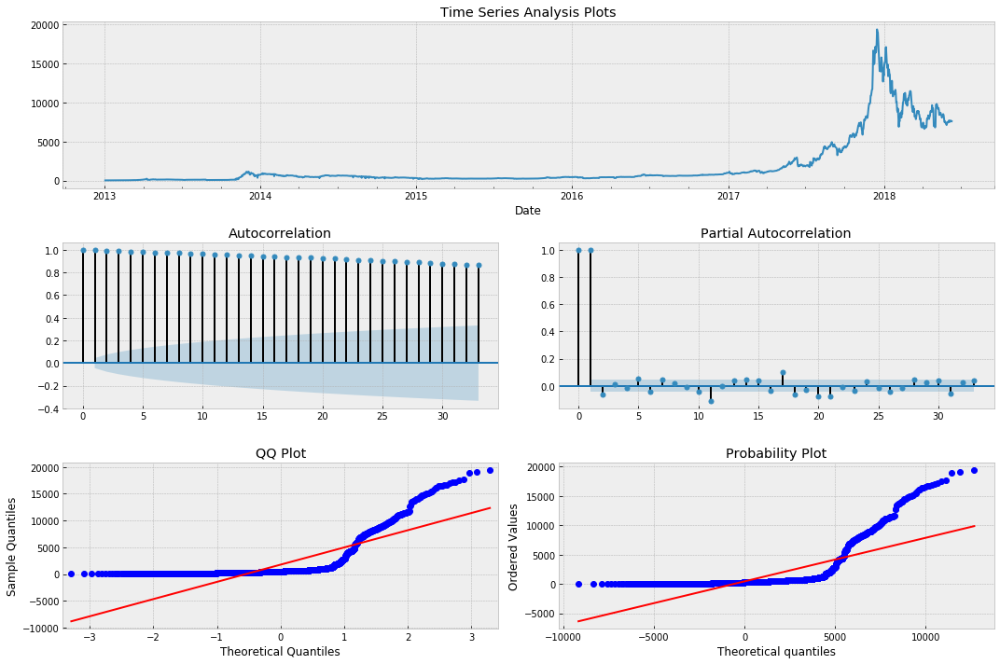

In [20]:
da.tsplot(df_adj['Close'], lags=33)

# <span style='color:crimson'>*.</span> Input-Output Definition

In [21]:
df = df_adj.copy()

input_cols = ['Close','High','Low','Open','Volume']
target_col = ['Direction']

# The last index does not correspond to a sample because there is no information about the next day's direction
X_raw, y_raw = df.loc[df.index[:-1],input_cols], df[target_col].shift(-1).loc[df.index[:-1]]

assert all(y_raw.values==df[target_col].values[1:])
assert X_raw.shape[0]==y_raw.shape[0]

In [22]:
X_add_1 = pd.concat([df_fee, df_cost, df_nadd,df_txn,df_conf],axis=1)

# Which indicators we want (and their parameters)
X_net = pd.DataFrame(data=[], index=X_add_1.index, columns=[])
for col in X_add_1.columns:
    ind_param_list=[('DISP',{'window':3, 'col':col, 'ma_func':ta.EMA, 'output_colname':'%s_DISP_EMA3'%col}), 
                    ('DISP',{'window':7, 'col':col, 'ma_func':ta.SMA, 'output_colname':'%s_DISP_SMA7'%col}), 
                    ('DISP',{'window':15, 'col':col, 'ma_func':ta.EMA, 'output_colname':'%s_DISP_EMA15'%col}), 
                    ('DISP',{'window':30, 'col':col, 'ma_func':ta.SMA, 'output_colname':'%s_DISP_SMA30'%col}),
                    ('RSI',{'col':col}), 
                    ('MACD',{'col':col})]
    X_tmp = ta.get_indicators(X_add_1[[col]], indicator_list=ind_param_list)
    X_tmp = X_tmp.drop(columns=['MACD_Line','MACD_SigLine'])
    X_tmp = X_tmp.rename(columns={'RSI':'%s_RSI'%col, 'MACD_Hist':'%s_MACD'%col})
    X_net = pd.concat([X_net, X_tmp], axis=1)
    
X_net.shape

(1977, 30)

In [23]:
da.plotscatter(X_net)
X_net

,Fee_BTC_DISP_EMA3,Fee_BTC_DISP_SMA7,Fee_BTC_DISP_EMA15,Fee_BTC_DISP_SMA30,Fee_BTC_RSI,Fee_BTC_MACD,Cost_USD_DISP_EMA3,Cost_USD_DISP_SMA7,Cost_USD_DISP_EMA15,Cost_USD_DISP_SMA30,...,n_txn_DISP_EMA15,n_txn_DISP_SMA30,n_txn_RSI,n_txn_MACD,Conf_t_DISP_EMA3,Conf_t_DISP_SMA7,Conf_t_DISP_EMA15,Conf_t_DISP_SMA30,Conf_t_RSI,Conf_t_MACD
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.190293,NaN,NaN,NaN,NaN,NaN,0.832923,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.069224,NaN,NaN,NaN,NaN,NaN
2013-01-05,1.086880,NaN,NaN,NaN,NaN,NaN,0.908847,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.033454,NaN,NaN,NaN,NaN,NaN
2013-01-06,0.968065,NaN,NaN,NaN,NaN,NaN,1.140080,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.034818,NaN,NaN,NaN,NaN,NaN
2013-01-07,0.983774,1.047654,NaN,NaN,NaN,NaN,1.065456,1.119537,NaN,NaN,...,NaN,NaN,NaN,NaN,1.017111,1.086094,NaN,NaN,NaN,NaN
2013-01-08,0.883802,0.841107,NaN,NaN,NaN,NaN,1.036012,1.120633,NaN,NaN,...,NaN,NaN,NaN,NaN,0.940175,0.942433,NaN,NaN,NaN,NaN
2013-01-09,0.938317,0.839013,NaN,NaN,NaN,NaN,1.017688,1.112131,NaN,NaN,...,NaN,NaN,NaN,NaN,0.969165,0.937644,NaN,NaN,NaN,NaN
2013-01-10,1.654656,2.866360,NaN,NaN,NaN,NaN,0.863776,0.858769,NaN,NaN,...,NaN,NaN,NaN,NaN,0.946805,0.873782,NaN,NaN,NaN,NaN


In [24]:
X_add_2 = pd.concat([df_wiki, df_gtrends], axis=1)

X_trends = pd.DataFrame(data=[], index=X_add_1.index, columns=[])
for col in X_add_2.columns:
    ind_param_list=[('DISP',{'window':3, 'col':col, 'ma_func':ta.EMA, 'output_colname':'%s_DISP_EMA3'%col}), 
                    ('DISP',{'window':7, 'col':col, 'ma_func':ta.SMA, 'output_colname':'%s_DISP_SMA7'%col}), 
                    ('DISP',{'window':15, 'col':col, 'ma_func':ta.EMA, 'output_colname':'%s_DISP_EMA15'%col}), 
                    ('DISP',{'window':30, 'col':col, 'ma_func':ta.SMA, 'output_colname':'%s_DISP_SMA30'%col}),
                    ('RSI',{'col':col}), 
                    ('MACD',{'col':col})]
    X_tmp = ta.get_indicators(X_add_2[[col]], indicator_list=ind_param_list)
    X_tmp = X_tmp.drop(columns=['MACD_Line','MACD_SigLine'])
    X_tmp = X_tmp.rename(columns={'RSI':'%s_RSI'%col, 'MACD_Hist':'%s_MACD'%col})
    X_trends = pd.concat([X_trends, X_tmp], axis=1)

X_trends.shape

(1977, 12)

In [25]:
da.plotscatter(X_trends)
X_trends

,WikiHits_DISP_EMA3,WikiHits_DISP_SMA7,WikiHits_DISP_EMA15,WikiHits_DISP_SMA30,WikiHits_RSI,WikiHits_MACD,GTrends_DISP_EMA3,GTrends_DISP_SMA7,GTrends_DISP_EMA15,GTrends_DISP_SMA30,GTrends_RSI,GTrends_MACD
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
2013-01-05,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
2013-01-06,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
2013-01-07,1.000000,1.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN
2013-01-08,1.000000,1.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN
2013-01-09,1.000000,1.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN
2013-01-10,1.000000,1.000000,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN


# <span style='color:crimson'>4.</span> Data Transformation

**Good references: [1,6,33,35,39]**

In [26]:
X = X_raw.copy()
X_diff = da.difference_ts(df=X)
X.describe()

,Close,High,Low,Open,Volume
count,1984.000000,1984.000000,1984.000000,1984.000000,1984.000000
mean,1756.699035,1819.525262,1675.130127,1752.929479,22560.320281
std,3217.422428,3356.809700,3034.456367,3215.153075,20199.692121
min,13.090000,13.150000,12.840000,13.090000,453.563089
25%,248.549375,254.953050,242.978315,248.350039,9313.901074
50%,476.625002,493.351660,456.569750,475.283000,16537.886083
75%,1001.141833,1028.992750,945.177667,998.937417,29575.732484
max,19388.165000,19734.497500,18700.237500,19385.602500,200943.863365


# <span style='color:crimson'>3.</span> Data Generation

**Good references: [1,6,33,35,39]**

## <span style='color:MediumBlue'>3.1.</span> Lagged Values

In [27]:
def lag_features(X, n_lags):
    X_lag = pd.DataFrame(data=[], index=X.index, columns=[]) # empty dataframe
    for lag in range(0,n_lags):
        col_names = {col:col+'(t-%d)'%lag for col in X.columns}
        X_tmp = X.shift(periods=lag)
        X_tmp = X_tmp.rename(columns=col_names)
        X_lag = pd.concat([X_lag, X_tmp], axis=1)
    return X_lag

In [28]:
X = X_diff.copy()

# Test #1: LAGGED VALS (number of lags defined in the beginning of the script)
n_lags=2
X_lag = lag_features(X, n_lags)
X_lag.describe()

,Close(t-0),High(t-0),Low(t-0),Open(t-0),Volume(t-0),Close(t-1),High(t-1),Low(t-1),Open(t-1),Volume(t-1)
count,1983.000000,1983.000000,1983.000000,1983.000000,1983.000000,1982.000000,1982.000000,1982.000000,1982.000000,1982.000000
mean,3.834512,3.874027,3.794738,3.867389,5.514024,3.871205,3.902865,3.842086,3.856038,8.336985
std,231.982485,213.176808,247.233681,233.109701,15871.071273,232.035274,213.226738,247.287081,233.167982,15874.578609
min,-2136.675000,-2293.045000,-4015.647500,-2585.707500,-149359.513477,-2136.675000,-2293.045000,-4015.647500,-2585.707500,-149359.513477
25%,-5.730000,-5.692500,-3.981233,-5.398167,-5583.340439,-5.686756,-5.671250,-3.954500,-5.409083,-5576.403120
50%,0.583343,-0.119377,1.301333,0.620000,-458.519200,0.587297,-0.112189,1.305804,0.615000,-436.194237
75%,8.579398,7.332400,10.633085,8.507367,4856.401159,8.589199,7.332687,10.636543,8.475250,4857.180410
max,2892.135000,3339.247500,2764.577500,2893.340000,161700.645447,2892.135000,3339.247500,2764.577500,2893.340000,161700.645447


## <span style='color:MediumBlue'>3.1.</span> Technical Indicators

In [29]:
X = X_raw.copy()

# Which indicators we want (and their parameters)
ind_param_list=[('SMA',{'window':20,'output_colname':'SMA20'}),('EMA',{'window':15,'output_colname':'EMA15'}),
                ('BB',{}), ('MACD',{}), ('STOCH',{}), 
                ('RSI',{}), ('CHAIKIN',{}),('AROON',{}), ('OBV',{}), ('PVT',{}), 
                ('DISP',{'window':10, 'ma_func':ta.SMA, 'output_colname':'DISP_SMA10'}), 
                ('DISP',{'window':5, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA5'}), 
                ('ROC',{'gap':1, 'output_colname':'ROC1'}), ('WILLIAMS',{}), ('CCI',{})]

X_ta = ta.get_indicators(X, indicator_list=ind_param_list)

X_ta.describe()

,SMA20,EMA15,BB_Bottom,BB_Middle,BB_Top,MACD_Hist,MACD_Line,MACD_SigLine,%D,%K,...,Aroon_Down,Aroon_Osc,Aroon_Up,OBV,PVT,DISP_SMA10,DISP_EMA5,ROC1,Williams_%R,CCI
count,1965.000000,1970.000000,1965.000000,1965.000000,1965.000000,1951.000000,1959.000000,1951.000000,1969.000000,1971.000000,...,1961.000000,1961.000000,1961.000000,1.984000e+03,1984.000000,1975.000000,1980.000000,1983.000000,1971.000000,1965.000000
mean,1737.105194,1741.943773,1379.728173,1737.105194,2094.482215,-0.431057,28.224008,28.763364,60.027042,60.052341,...,39.261431,13.558134,52.819565,1.130440e+06,131926.609954,1.016498,1.005554,1.006584,-39.947659,24.347760
std,3174.743287,3173.175885,2451.555570,3174.743287,3931.205092,82.347024,280.977339,265.855255,25.993679,28.606498,...,32.819777,60.008114,36.461555,1.110393e+06,71894.767425,0.106940,0.058252,0.088337,28.606498,119.094759
min,14.137000,13.627333,-49.118208,14.137000,16.115293,-721.576899,-1451.684128,-1267.768308,3.524018,0.055943,...,4.166667,-95.833333,4.166667,-8.857629e+04,-13085.959884,0.540521,0.578028,0.514815,-99.944057,-653.584277
25%,250.950950,250.904375,225.818178,250.950950,286.880403,-3.247564,-8.965317,-8.301684,38.211781,36.287412,...,8.333333,-37.500000,12.500000,1.978917e+05,107425.682978,0.977505,0.988446,0.987083,-63.712588,-55.999387
50%,473.723038,480.625148,413.093997,473.723038,588.795394,0.392037,2.749829,2.884706,63.171393,63.772272,...,29.166667,25.000000,54.166667,6.169457e+05,128700.097496,1.010036,1.004686,1.002641,-36.227728,30.595359
75%,945.065400,954.009404,823.223107,945.065400,1162.725931,4.452578,19.974050,20.730495,83.099709,86.443864,...,66.666667,70.833333,91.666667,2.010756e+06,170243.250885,1.054424,1.025294,1.020786,-13.556136,112.732777
max,16330.411250,16353.248047,13121.320425,16330.411250,21076.621773,613.857220,2562.880226,2319.627579,98.564332,100.000000,...,100.000000,95.833333,100.000000,3.794663e+06,309328.893498,2.069192,1.556928,2.189953,-0.000000,535.725142


In [30]:
X = X_ta.copy()

X_ta_lag = lag_features(X, 3)
X_ta_lag.shape

(1984, 66)

### <span style='color:Goldenrod'>3.1.1.</span> Kim [2003]

In [31]:
X = X_raw.copy()

ind_param_list = [('STOCH',{}), 
                  ('ROC',{'gap':1, 'output_colname':'ROC1'}),
                  ('WILLIAMS',{}),
                  ('CHAIKIN',{}),
                  ('DISP',{'window':5, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA5'}), 
                  ('DISP',{'window':10, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA10'}), 
                  ('CCI',{}),
                  ('RSI',{})
                 ]

X_ta_ref33 = ta.get_indicators(X, indicator_list=ind_param_list)
X_ta_ref33.describe()

,%D,%K,ROC1,Williams_%R,CHAIKIN,DISP_EMA5,DISP_EMA10,CCI,RSI
count,1969.000000,1971.000000,1983.000000,1971.000000,1975.000000,1980.000000,1975.000000,1965.000000,1970.000000
mean,60.027042,60.052341,1.006584,-39.947659,10513.826779,1.005554,1.013509,24.347760,55.146331
std,25.993679,28.606498,0.088337,28.606498,18528.571709,0.058252,0.090875,119.094759,15.169365
min,3.524018,0.055943,0.514815,-99.944057,-67347.199497,0.578028,0.550602,-653.584277,14.741074
25%,38.211781,36.287412,0.987083,-63.712588,-264.505485,0.988446,0.979998,-55.999387,44.593075
50%,63.171393,63.772272,1.002641,-36.227728,7400.310046,1.004686,1.007864,30.595359,52.538907
75%,83.099709,86.443864,1.020786,-13.556136,17422.750925,1.025294,1.048110,112.732777,64.760214
max,98.564332,100.000000,2.189953,-0.000000,108046.215624,1.556928,1.860530,535.725142,97.089080


### <span style='color:Goldenrod'>3.1.1.</span> Mine

In [32]:
X = X_raw.copy()

ind_param_list = [('DISP',{'window':1, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA1'}), 
                  ('DISP',{'window':3, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA3'}), 
                  ('DISP',{'window':5, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA5'}), 
                  ('DISP',{'window':10, 'ma_func':ta.EMA, 'output_colname':'DISP_EMA10'}), 
                  ('ROC',{'gap':2, 'output_colname':'ROC2'}),
                  ('ROC',{'gap':7, 'output_colname':'ROC7'}),
                  ('STOCH',{}), 
                  ('WILLIAMS',{}),
                  ('CHAIKIN',{}),
                  ('BB',{}), 
                  ('MACD',{}), 
                  ('RSI',{}),
                  ('AROON',{}),
                  ('CCI',{}),
                  ('PVT',{})
                 ]

X_ta_mine = ta.get_indicators(X, indicator_list=ind_param_list)
# X_ta_mine = lag_features(X_ta_mine, 3)
X_ta_mine.shape

(1984, 22)

## <span style='color:MediumBlue'>3.2.</span> Sentiment Analysis

In [33]:
X_sa = df_sa.copy()
X_sa

,Positive,Negative,Neutral,Polarity
Date,,,,
2013-01-01,0.451923,0.182692,0.365385,0.424242
2013-01-02,0.500000,0.190909,0.309091,0.447368
2013-01-03,0.522523,0.171171,0.306306,0.506494
2013-01-04,0.401786,0.178571,0.419643,0.384615
2013-01-05,0.553191,0.085106,0.361702,0.733333
2013-01-06,0.475728,0.155340,0.368932,0.507692
2013-01-07,0.396226,0.245283,0.358491,0.235294
2013-01-08,0.436508,0.174603,0.388889,0.428571
2013-01-09,0.472000,0.240000,0.288000,0.325843


## <span style='color:MediumBlue'>3.*.</span> Final Features

In [34]:
#======== [USER-DEFINED] ========#
# DataFrame of raw features: join the desired ones
X_rawfeat = pd.concat([X_ta_mine, X_net, X_trends, X_sa], axis=1)
#================================#

# X_rawfeat.describe()
X_rawfeat.columns

Index(['DISP_EMA1', 'DISP_EMA3', 'DISP_EMA5', 'DISP_EMA10', 'ROC2', 'ROC7',
       '%D', '%K', 'Williams_%R', 'CHAIKIN', 'BB_Bottom', 'BB_Middle',
       'BB_Top', 'MACD_Hist', 'MACD_Line', 'MACD_SigLine', 'RSI', 'Aroon_Down',
       'Aroon_Osc', 'Aroon_Up', 'CCI', 'PVT', 'Fee_BTC_DISP_EMA3',
       'Fee_BTC_DISP_SMA7', 'Fee_BTC_DISP_EMA15', 'Fee_BTC_DISP_SMA30',
       'Fee_BTC_RSI', 'Fee_BTC_MACD', 'Cost_USD_DISP_EMA3',
       'Cost_USD_DISP_SMA7', 'Cost_USD_DISP_EMA15', 'Cost_USD_DISP_SMA30',
       'Cost_USD_RSI', 'Cost_USD_MACD', 'n_add_DISP_EMA3', 'n_add_DISP_SMA7',
       'n_add_DISP_EMA15', 'n_add_DISP_SMA30', 'n_add_RSI', 'n_add_MACD',
       'n_txn_DISP_EMA3', 'n_txn_DISP_SMA7', 'n_txn_DISP_EMA15',
       'n_txn_DISP_SMA30', 'n_txn_RSI', 'n_txn_MACD', 'Conf_t_DISP_EMA3',
       'Conf_t_DISP_SMA7', 'Conf_t_DISP_EMA15', 'Conf_t_DISP_SMA30',
       'Conf_t_RSI', 'Conf_t_MACD', 'WikiHits_DISP_EMA3', 'WikiHits_DISP_SMA7',
       'WikiHits_DISP_EMA15', 'WikiHits_DISP_SMA30', 'WikiH

In [35]:
# Last step: define margin (dependencies) and remove NaNs
X = X_rawfeat.copy()
y = y_raw.copy()

# Margin: maximum number of NaNs in a column
margin = X.isna().sum().max()

X_feat = X.dropna()
y_feat = y.loc[X_feat.index]
y_feat['Direction'] = skp.label_binarize(y_feat, classes=[-1, 1])

assert X_feat.isna().sum().sum() == 0
assert y_feat.shape[0]==X_feat.shape[0]

print(margin)
X_feat.shape

41


(1943, 68)

# <span style='color:crimson'>4.</span> Data Transformation

## <span style='color:MediumBlue'>4.1.</span> Scaling/Normalization

Fonte: http://scikit-learn.org/stable/modules/preprocessing.html

In [36]:
# Isso tem que virar uma funcao
def scale_train_test_sets(X_train, X_test=None):
    # Define scaler
    scaler = skp.MinMaxScaler(feature_range=(-1,1))

    # COLUMN-WISE transformation, i.e., transform each feature independently
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), index=X_train.index, columns=X_train.columns) 

    if X_test is not None:
        # Apply same scaling parameters to test set (during test we do not know future values to scale)
        X_test_scaled = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)
    else:
        X_test_scaled = None

    return X_train_scaled, X_test_scaled

# <span style='color:crimson'>5.</span> Feature Selection

## <span style='color:MediumBlue'>5.1.</span> Correlation

In [37]:
corr_dict = {col: np.correlate(X_feat[col].values.ravel(), 
df_raw.loc[X_feat.index,'Close'].values.ravel()) for col in X_feat.columns}
corr_dict
corr_dict = {col: np.correlate(X_feat[col].values.ravel(), y_feat.values.ravel()) for col in X_feat.columns}
corr_dict

{'%D': array([64672.02599536]),
 '%K': array([64080.30042488]),
 'Aroon_Down': array([39962.5]),
 'Aroon_Osc': array([19300.]),
 'Aroon_Up': array([59262.5]),
 'BB_Bottom': array([1360766.6585391]),
 'BB_Middle': array([1718930.35484958]),
 'BB_Top': array([2077094.05116007]),
 'CCI': array([29975.02380955]),
 'CHAIKIN': array([12034198.15488828]),
 'Conf_t_DISP_EMA15': array([1054.48001492]),
 'Conf_t_DISP_EMA3': array([1051.38777303]),
 'Conf_t_DISP_SMA30': array([1058.14469961]),
 'Conf_t_DISP_SMA7': array([1058.63701666]),
 'Conf_t_MACD': array([2.06259953]),
 'Conf_t_RSI': array([52682.84871701]),
 'Cost_USD_DISP_EMA15': array([1075.96418693]),
 'Cost_USD_DISP_EMA3': array([1056.80039905]),
 'Cost_USD_DISP_SMA30': array([1108.3485729]),
 'Cost_USD_DISP_SMA7': array([1067.50894305]),
 'Cost_USD_MACD': array([5.96952657]),
 'Cost_USD_RSI': array([55108.83978532]),
 'DISP_EMA1': array([1056.]),
 'DISP_EMA10': array([1069.22815266]),
 'DISP_EMA3': array([1056.13132914]),
 'DISP_EMA5':

In [38]:
{col: scs.pearsonr(x=X_feat[col].values.ravel(), 
                   y=df_raw.loc[X_feat.index,'Close'].values.ravel()) for col in X_feat.columns}
{col: scs.pearsonr(x=X_feat[col].values.ravel(), y=y_feat.values.ravel()) for col in X_feat.columns}


/opt/anaconda3/envs/crypto-env/lib/python3.6/site-packages/scipy/stats/stats.py:3003: RuntimeWarning:

invalid value encountered in double_scalars



{'%D': (0.05944078284090677, 0.008773664910555722),
 '%K': (0.033831334755748045, 0.1360312195717933),
 'Aroon_Down': (-0.04806950246046732, 0.03411247757088116),
 'Aroon_Osc': (0.08696627247776934, 0.0001239222268390217),
 'Aroon_Up': (0.09964362097483284, 1.0806806367335915e-05),
 'BB_Bottom': (-0.03499937871115648, 0.12301677165344076),
 'BB_Middle': (-0.03344420597482174, 0.14057139564334445),
 'BB_Top': (-0.03220250654198777, 0.15592115741379342),
 'CCI': (0.04288690901961861, 0.058746533763562425),
 'CHAIKIN': (0.04706105352182839, 0.03805695340779225),
 'Conf_t_DISP_EMA15': (0.006108533153405876, 0.7878603021037128),
 'Conf_t_DISP_EMA3': (-0.007251471438370336, 0.7493932263535414),
 'Conf_t_DISP_SMA30': (0.00876109333322062, 0.6995386837908887),
 'Conf_t_DISP_SMA7': (0.007711772651067184, 0.734069525223028),
 'Conf_t_MACD': (0.00993436660868312, 0.661654049843476),
 'Conf_t_RSI': (0.0016320978909188434, 0.9426848584733286),
 'Cost_USD_DISP_EMA15': (0.04296987306572485, 0.0582588

In [39]:
print(smt.stattools.grangercausalitytests(x=np.concatenate(
    (y_feat.values.ravel().reshape(-1,1), X_feat['RSI'].values.reshape(-1,1)), axis=1), maxlag=5))


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1864 , p=0.0000  , df_denom=1939, df_num=1
ssr based chi2 test:   chi2=17.2130 , p=0.0000  , df=1
likelihood ratio test: chi2=17.1372 , p=0.0000  , df=1
parameter F test:         F=17.1864 , p=0.0000  , df_denom=1939, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.6949 , p=0.0000  , df_denom=1936, df_num=2
ssr based chi2 test:   chi2=25.4555 , p=0.0000  , df=2
likelihood ratio test: chi2=25.2900 , p=0.0000  , df=2
parameter F test:         F=12.6949 , p=0.0000  , df_denom=1936, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.6985  , p=0.0000  , df_denom=1933, df_num=3
ssr based chi2 test:   chi2=26.1899 , p=0.0000  , df=3
likelihood ratio test: chi2=26.0147 , p=0.0000  , df=3
parameter F test:         F=8.6985  , p=0.0000  , df_denom=1933, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.7157  , p=0.

## <span style='color:MediumBlue'>5.2.</span> Mutual Information

In [40]:
X_feat.columns[skf.mutual_info_classif(X=X_feat, y=y_feat)>0.001]

/opt/anaconda3/envs/crypto-env/lib/python3.6/site-packages/sklearn/utils/validation.py:578: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Index(['DISP_EMA1', 'DISP_EMA3', 'DISP_EMA5', 'DISP_EMA10', 'ROC2',
       'BB_Bottom', 'MACD_Hist', 'MACD_Line', 'MACD_SigLine', 'RSI', 'CCI',
       'PVT', 'Fee_BTC_MACD', 'Cost_USD_DISP_EMA3', 'Cost_USD_DISP_SMA30',
       'Cost_USD_MACD', 'n_add_DISP_EMA3', 'n_add_DISP_SMA7', 'n_add_MACD',
       'n_txn_DISP_EMA3', 'n_txn_DISP_SMA7', 'n_txn_DISP_EMA15',
       'Conf_t_DISP_EMA3', 'Conf_t_DISP_SMA7', 'Conf_t_RSI', 'Conf_t_MACD',
       'GTrends_DISP_SMA7', 'GTrends_DISP_EMA15', 'GTrends_DISP_SMA30',
       'GTrends_RSI', 'GTrends_MACD', 'Negative', 'Neutral'],
      dtype='object')

# <span style='color:crimson'>6.</span> Feature Extraction

## <span style='color:MediumBlue'>6.1.</span> PCA

In [41]:
def apply_pca(X_train, X_test):
    pca = skd.PCA()
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    #The amount of variance that each PC explains
    pve= pca.explained_variance_ratio_

    #Cumulative Variance explains
    cum_pve=np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)
    cutoff = cum_pve<99
    
    X_train_pca = X_train_pca[:,cutoff]
    X_test_pca  = X_test_pca[:,cutoff]
    
    return X_train_pca, X_test_pca

## <span style='color:MediumBlue'>6.2.</span> AE

# <span style='color:crimson'>7.</span> Test Design

In [42]:
y = y_feat

np.random.seed(12)
test_spec = tspec.TestSpec(indices=y.index, 
                            start_dates=start_dates, 
                            window_size=400,
                            margin=margin
                           )


# <span style='color:crimson'>*.</span> Train-test split

# <span style='color:crimson'>8.</span> Comparison Metrics

# <span style='color:crimson'>9.</span> Models

## <span style='color:MediumBlue'>9.1.</span> Logistic Regression

Fontes:
- http://scikit-learn.org/stable/modules/linear_model.html
- http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

**HYPERPARAMETERS**:
- `penalty` : str, `‘l1’` or `‘l2’`, default: ‘l2’
- `C` : float, default: `1.0` - 
    - Inverse of regularization strength; must be a positive float; smaller values = stronger regularization.
        - Small C: probability curves will look more like straight lines (long transition between 0-1)
        - Large C: probability curves will look more like step function (fast transition between 0-1)

In [43]:
def comparison_metric(perf_matrix, weights):
    weights = np.array(weights).reshape(-1,1)
    sorted_inds = np.argsort(perf_matrix, axis=0)
    value = np.repeat(np.arange(perf_matrix.shape[0]).reshape(-1,1), perf_matrix.shape[1], axis=1)
    rank = np.empty_like(sorted_inds)
    for i in range(sorted_inds.shape[0]):
        for j in range(sorted_inds.shape[1]):
            rank[sorted_inds[i,j],j] = value[i,j]
    rank_perf = np.matmul(rank[:,:weights.shape[0]], weights)
    return np.argmax(rank_perf)

In [52]:
# Consider 5 options 

metrics_available = {1:'1. AUC-ROC',          # theory:0-1; practice:~0.5
                     2:'2. Mathews_CorrCoef',  
                     3:'3. F-beta_0.5',       # theory:0-1; practice:~0.5
                     4:'4. F1',
                     5:'5. Cohen_Kappa',
                     6:'6. Precision', 
                     7:'7. Specificity', 
                     8:'8. Accuracy', 
                     9:'9. Recall'
                    }
n_metrics = 13 # CONSTANT

#================================ [USER-DEFINED] ================================#
# Hyperparameters
# n_trees = np.concatenate((np.arange(10,100,10), np.arange(100,200,20), np.arange(200,600,50), 
#                           np.arange(600,1001,100)), axis=-1)
n_trees = np.arange(100,1001,100)
kwparams_list = list({'n_estimators':nt} for nt in n_trees) 
weights = [1, 0.9, 0.8, 0.8, 0.7]
# weights = [1, 0, 0, 0, 0]
# weights = [0, 1, 0, 0, 0]
# weights = [0, 0, 1, 0, 0]
# weights = [0, 0, 0, 1, 0]
# weights = [0, 0, 0, 0, 1]
#================================================================================#
import warnings
warnings.filterwarnings(action='ignore')

# Observation:
# X = (samples/examples x features/inputs) = (m x n)
X = X_feat.copy()
y = y_feat.copy()

comp = 0
ml_res = {}
y_test_joined = np.array([])
y_prob_joined = np.array([])
y_pred_joined = np.array([])
for inst in range(len(test_spec.instance)):
    # Define test instance
    instance = test_spec.instance[inst]

    # Define test set
    X_test = instance.test_set

    # Cross-validation
    best_perf = 0
    perf_matrix = np.zeros((len(kwparams_list),n_metrics))
    iparam = 0                       
    for kwparams in kwparams_list:
        print(kwparams)
        for fold in range(instance.CrossValidation.n_folds):
            # Get cross-validation sets
            train_ind = instance.expanding_window_cv.train_sets[fold]
            val_ind = instance.expanding_window_cv.val_sets[fold]
            X_train, X_val = X.loc[train_ind], X.loc[val_ind]
            y_train, y_val = y.loc[train_ind], y.loc[val_ind]

            assert all(X_train.index == y_train.index) and all(X_val.index == y_val.index)

            # Scale values
            X_train, X_val = scale_train_test_sets(X_train, X_val)
            X_train, X_val = apply_pca(X_train, X_val)
            if comp==0:
                print('Number of components: %d'%X_train.shape[1])
                comp +=1
            y_train, y_val = y_train.values.ravel(), y_val.values.ravel() # transforms into array (m,)

            # Fit random forest model
            rf = ske.AdaBoostClassifier(skt.DecisionTreeClassifier(max_depth=1), **kwparams)
#                                         , algorithm='SAMME.R', learning_rate=0.5)
            rf.fit(X_train, y_train)

            y_pred = rf.predict(X_val)
            y_prob = rf.predict_proba(X_val) # use for AUC-ROC

            fold_perf = da.classification_metrics(y_true=y_val, y_pred=y_pred, y_prob=y_prob[:,1])
            perf_matrix[iparam,:] += list(fold_perf.values())
        iparam += 1

    i_best_params = comparison_metric(perf_matrix, weights)
    best_params = kwparams_list[i_best_params]
    print(best_params)

    # Train on entire train set
    X_train, X_test = X.loc[instance.train_set], X.loc[instance.test_set]
    y_train, y_test = y.loc[instance.train_set], y.loc[instance.test_set]

    # Scale values
    X_train, X_test = scale_train_test_sets(X_train, X_test)
    X_train, X_test = apply_pca(X_train, X_test)
    y_train, y_test = y_train.values.ravel(), y_test.values.ravel() # transforms into array (m,)

    # Apply best hyperparameters
    rf = ske.AdaBoostClassifier(skt.DecisionTreeClassifier(max_depth=1), **best_params)
    rf.fit(X_train, y_train)

    # Predict classes and probabilities
    y_pred = rf.predict(X_test)
    y_prob = rf.predict_proba(X_test) # use for AUC-ROC

    # Test performance
    ml_res['LR_Test-%d'%inst] = da.classification_metrics(y_true=y_test, y_pred=y_pred, y_prob=y_prob[:,1])
    
    # Join to get complete statistics later
    y_test_joined = np.concatenate([y_test_joined,y_test], axis=0)
    y_prob_joined = np.concatenate([y_prob_joined,y_prob[:,1]], axis=0)
    y_pred_joined = np.concatenate([y_pred_joined,y_pred], axis=0)
        
ml_res['LR_Test-all'] = da.classification_metrics(y_true=y_test_joined, y_pred=y_pred_joined, 
                                                  y_prob=y_prob_joined)    
test_perf = pd.DataFrame(data=ml_res)                                     

{'n_estimators': 100}
{'n_estimators': 200}
{'n_estimators': 300}
{'n_estimators': 400}
{'n_estimators': 500}
{'n_estimators': 600}
{'n_estimators': 700}
{'n_estimators': 800}
{'n_estimators': 900}
{'n_estimators': 1000}
{'n_estimators': 900}
{'n_estimators': 100}
{'n_estimators': 200}
{'n_estimators': 300}
{'n_estimators': 400}
{'n_estimators': 500}
{'n_estimators': 600}
{'n_estimators': 700}
{'n_estimators': 800}
{'n_estimators': 900}
{'n_estimators': 1000}
{'n_estimators': 200}
{'n_estimators': 100}
{'n_estimators': 200}
{'n_estimators': 300}
{'n_estimators': 400}
{'n_estimators': 500}
{'n_estimators': 600}
{'n_estimators': 700}
{'n_estimators': 800}
{'n_estimators': 900}
{'n_estimators': 1000}
{'n_estimators': 500}
{'n_estimators': 100}
{'n_estimators': 200}
{'n_estimators': 300}
{'n_estimators': 400}
{'n_estimators': 500}
{'n_estimators': 600}
{'n_estimators': 700}
{'n_estimators': 800}
{'n_estimators': 900}
{'n_estimators': 1000}
{'n_estimators': 900}


# <span style='color:crimson'>10.</span> Results

In [53]:
test_perf.rename(columns={'LR_Test-0':'ADA_Test-1','LR_Test-1':'ADA_Test-2',
                          'LR_Test-2':'ADA_Test-3','LR_Test-3':'ADA_Test-4',
                          'LR_Test-all':'ADA_Test-total'
                         })

,ADA_Test-1,ADA_Test-2,ADA_Test-3,ADA_Test-4,ADA_Test-total
1. AUC-ROC,0.419687,0.412037,0.411606,0.564760,0.451745
2. Mathews_CorrCoef,-0.029488,0.080887,-0.078003,0.148414,-0.058965
3. F-beta_0.5,0.150000,0.643116,0.477816,0.566343,0.550224
4. F1,0.070588,0.739583,0.459016,0.666667,0.564860
5. Cohen_Kappa,-0.008511,0.029356,-0.077335,0.087377,-0.058621
6. Precision,0.600000,0.591667,0.491228,0.514706,0.540881
7. Specificity,0.950000,0.039216,0.491228,0.142857,0.351111
8. Accuracy,0.341667,0.593496,0.459016,0.536424,0.486434
9. Recall,0.037500,0.986111,0.430769,0.945946,0.591065
FN,77.000000,1.000000,37.000000,4.000000,119.000000
